<a href="https://colab.research.google.com/github/SmrutiNIT/project/blob/main/1Copy_of_DS_2project_24_april_.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**Disease Condition prediction based on drug reviews**

In [14]:
import pandas as pd # data preprocessing
import itertools # confusion matrix
import string
import numpy as np
import seaborn as sns
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.model_selection import train_test_split
from sklearn.linear_model import PassiveAggressiveClassifier
from sklearn.naive_bayes import MultinomialNB
from sklearn import metrics
import matplotlib.pyplot as plt
%matplotlib inline
# To show all the rows of pandas dataframe
pd.set_option('display.max_rows', None)

In [23]:
drug=pd.read_csv('/content/drugsCom_raw (1).tsv',  sep='\t', encoding='latin-1')

In [22]:
drug.head()

,Unnamed: 0,drugName,condition,review,rating,date,usefulCount
0,206461,Valsartan,Left Ventricular Dysfunction,"""It has no side effect, I take it in combinati...",9.0,"May 20, 2012",27.0
1,95260,Guanfacine,ADHD,"""My son is halfway through his fourth week of ...",8.0,"April 27, 2010",192.0
2,92703,Lybrel,Birth Control,"""I used to take another oral contraceptive, wh...",5.0,"December 14, 2009",17.0
3,138000,Ortho Evra,Birth Control,"""This is my first time using any form of birth...",8.0,"November 3, 2015",10.0
4,35696,Buprenorphine / naloxone,Opiate Dependence,"""Suboxone has completely turned my life around...",9.0,"November 27, 2016",37.0


In [24]:
drug.columns

Index(['Unnamed: 0', 'drugName', 'condition', 'review', 'rating', 'date',
       'usefulCount'],
      dtype='object')

In [25]:
drug.describe()

,Unnamed: 0,rating,usefulCount
count,104451.000000,104450.000000,104450.000000
mean,116057.358733,6.989277,27.998506
std,66995.284262,3.276475,36.638584
min,2.000000,1.000000,0.000000
25%,58466.000000,5.000000,6.000000
50%,116001.000000,8.000000,16.000000
75%,173866.000000,10.000000,36.000000
max,232291.000000,10.000000,1291.000000


In [26]:
drug.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 104451 entries, 0 to 104450
Data columns (total 7 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   Unnamed: 0   104451 non-null  int64  
 1   drugName     104451 non-null  object 
 2   condition    103853 non-null  object 
 3   review       104450 non-null  object 
 4   rating       104450 non-null  float64
 5   date         104450 non-null  object 
 6   usefulCount  104450 non-null  float64
dtypes: float64(2), int64(1), object(4)
memory usage: 5.6+ MB


In [27]:
drug.dtypes

Unnamed: 0       int64
drugName        object
condition       object
review          object
rating         float64
date            object
usefulCount    float64
dtype: object

In [28]:
drug['condition'].nunique()

811

In [53]:
drug.head(25)

,Unnamed: 0,drugName,condition,review,rating,date,usefulCount
0,206461,Valsartan,Left Ventricular Dysfunction,"""It has no side effect, I take it in combinati...",9.0,"May 20, 2012",27.0
1,95260,Guanfacine,ADHD,"""My son is halfway through his fourth week of ...",8.0,"April 27, 2010",192.0
2,92703,Lybrel,Birth Control,"""I used to take another oral contraceptive, wh...",5.0,"December 14, 2009",17.0
3,138000,Ortho Evra,Birth Control,"""This is my first time using any form of birth...",8.0,"November 3, 2015",10.0
4,35696,Buprenorphine / naloxone,Opiate Dependence,"""Suboxone has completely turned my life around...",9.0,"November 27, 2016",37.0
5,155963,Cialis,Benign Prostatic Hyperplasia,"""2nd day on 5mg started to work with rock hard...",2.0,"November 28, 2015",43.0
6,165907,Levonorgestrel,Emergency Contraception,"""He pulled out, but he cummed a bit in me. I t...",1.0,"March 7, 2017",5.0
7,102654,Aripiprazole,Bipolar Disorde,"""Abilify changed my life. There is hope. I was...",10.0,"March 14, 2015",32.0
8,74811,Keppra,Epilepsy,""" I Ve had nothing but problems with the Kepp...",1.0,"August 9, 2016",11.0
9,48928,Ethinyl estradiol / levonorgestrel,Birth Control,"""I had been on the pill for many years. When m...",8.0,"December 8, 2016",1.0


In [30]:
condition1 = ['Depression','High Blood Pressure','Diabetes, Type 2']
drug1=drug[drug['condition'].isin(condition1)]
drug1

,Unnamed: 0,drugName,condition,review,rating,date,usefulCount
11,75612,L-methylfolate,Depression,"""I have taken anti-depressants for years, with...",10.0,"March 9, 2017",54.0
31,96233,Sertraline,Depression,"""1 week on Zoloft for anxiety and mood swings....",8.0,"May 7, 2011",3.0
44,121333,Venlafaxine,Depression,"""my gp started me on Venlafaxine yesterday to ...",4.0,"April 27, 2016",3.0
50,156544,Dulaglutide,"Diabetes, Type 2","""Hey Guys, It&#039;s been 4 months since my l...",10.0,"October 24, 2017",24.0
67,131909,Effexor XR,Depression,"""This medicine saved my life. I was at my wits...",10.0,"June 20, 2013",166.0
81,171349,Wellbutrin,Depression,"""Started taking it and I slept well at night a...",4.0,"January 13, 2017",15.0
96,102810,Aripiprazole,Depression,"""Intake Effexor XR 375 mg, and lorazepam for d...",4.0,"August 17, 2012",33.0
104,208641,Amlodipine / olmesartan,High Blood Pressure,"""My blood pressure has been around 160/100. Do...",10.0,"January 19, 2015",10.0
143,186257,Desvenlafaxine,Depression,"""This medication is amazing! After 3 days of b...",10.0,"March 10, 2013",101.0
146,156730,Dulaglutide,"Diabetes, Type 2","""I was recently referred to a endocrinologist ...",9.0,"November 5, 2015",12.0


In [31]:
drug1['condition'].unique()

array(['Depression', 'Diabetes, Type 2', 'High Blood Pressure'],
      dtype=object)

In [32]:
# Converting the date in to date time format
#drug1['date'] = pd.to_datetime(drug1['date'])

In [33]:
drug1.loc[drug1['rating'] == 1, :]['drugName'].value_counts().head(10)

Venlafaxine     53
Lisinopril      43
Vortioxetine    42
Bupropion       38
Duloxetine      33
Cymbalta        32
Pristiq         31
Dulaglutide     31
Effexor         31
Trulicity       30
Name: drugName, dtype: int64

In [47]:
#check number of unique values in drugName
print(drug1['drugName'].nunique())

#check number of unique values in condition
print(drug1['condition'].nunique())

312
3


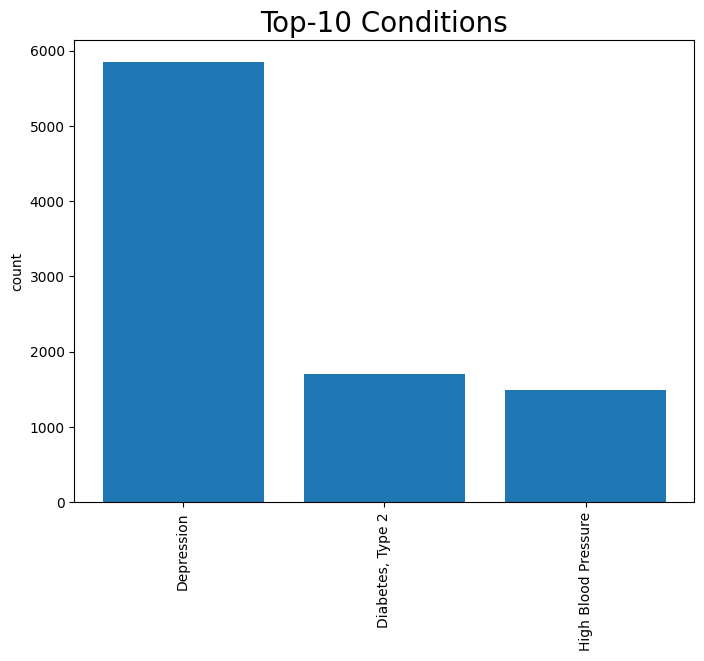

In [35]:
#plot a bargraph to check top 10 conditions
plt.figure(figsize=(8,6))
conditions = drug1['condition'].value_counts(ascending = False).head(10)

plt.bar(conditions.index,conditions.values)
plt.title('Top-10 Conditions',fontsize = 20)
plt.xticks(rotation=90)
plt.ylabel('count')
plt.show()

From above graph we can see that  :

Depression is nearly three times  as big as anyone, around 5000.

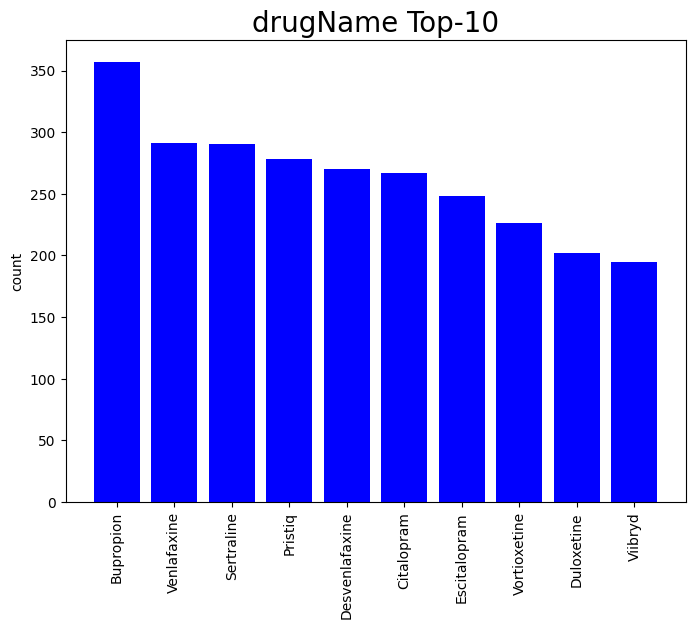

In [36]:
#plot a bargraph to check top 10 drugName
plt.figure(figsize=(8,6))
drugName_top = drug1['drugName'].value_counts(ascending = False).head(10)

plt.bar(drugName_top.index,drugName_top.values,color='blue')
plt.title('drugName Top-10',fontsize = 20)
plt.xticks(rotation=90)
plt.ylabel('count')
plt.show()

In [37]:
# The top drugName is Brupopion.
 

In [38]:
ratings_ = drug1['rating'].value_counts().sort_values(ascending=False).reset_index().\
                    rename(columns = {'index' :'rating', 'rating' : 'counts'})
ratings_['percent'] = 100 * (ratings_['counts']/drug.shape[0])
print(ratings_)

   rating  counts   percent
0    10.0    2442  2.337938
1     9.0    1568  1.501182
2     1.0    1201  1.149821
3     8.0    1125  1.077060
4     7.0     661  0.632833
5     5.0     484  0.463375
6     2.0     437  0.418378
7     6.0     424  0.405932
8     3.0     393  0.376253
9     4.0     311  0.297747


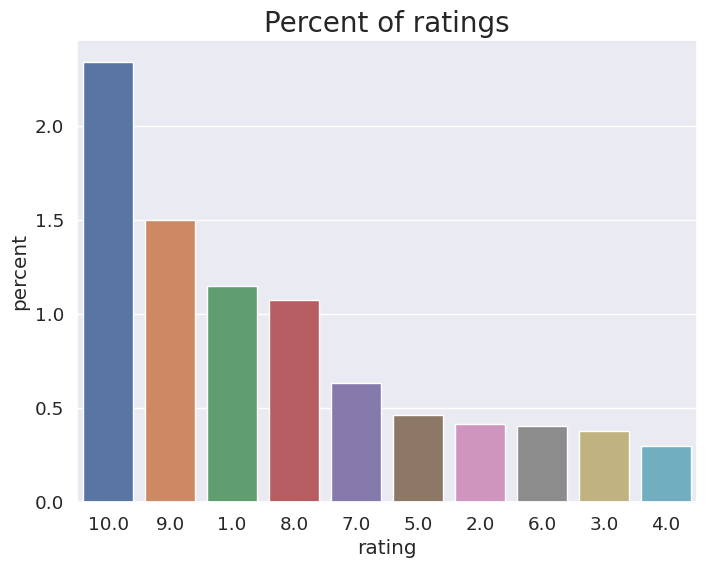

In [39]:
# Setting the Parameter
sns.set(font_scale = 1.2)
plt.rcParams['figure.figsize'] = [8, 6]

#let's plot and check
sns.barplot(x = ratings_['rating'], y = ratings_['percent'],order = ratings_['rating'])
plt.title('Percent of ratings',fontsize=20)
plt.show()

We notice that most of the ratings are high with ratings 10 and 9.

Rating 1 is also high which shows the extreme ratings of the user which shows that there is some side effects.

About 80% of the values have rating greater than 5.

<ipython-input-68-256667934bbc>:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(drug1['usefulCount'])


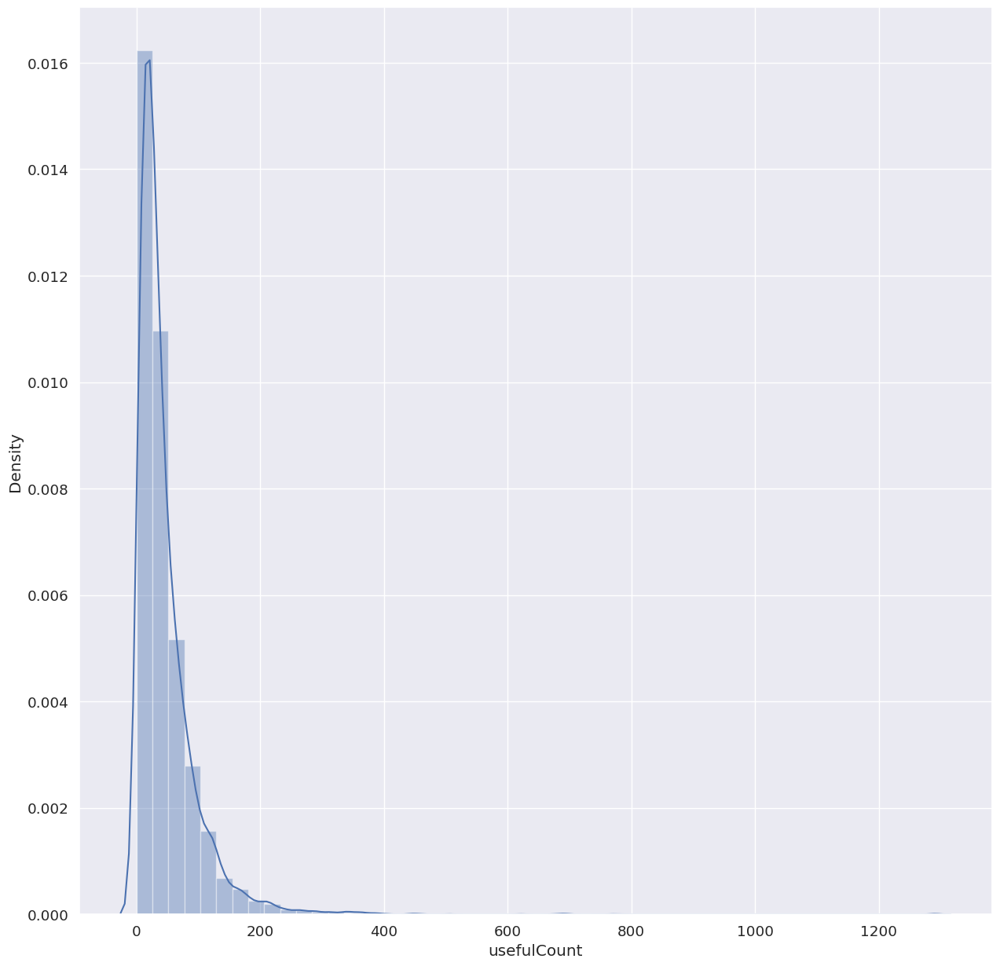

In [68]:
#Plot a distplot of usefulCount
sns.distplot(drug1['usefulCount'])
plt.show()

usefulCount is positive-skewed.

Most of the usefulCounts are distributed between 0 and 190.

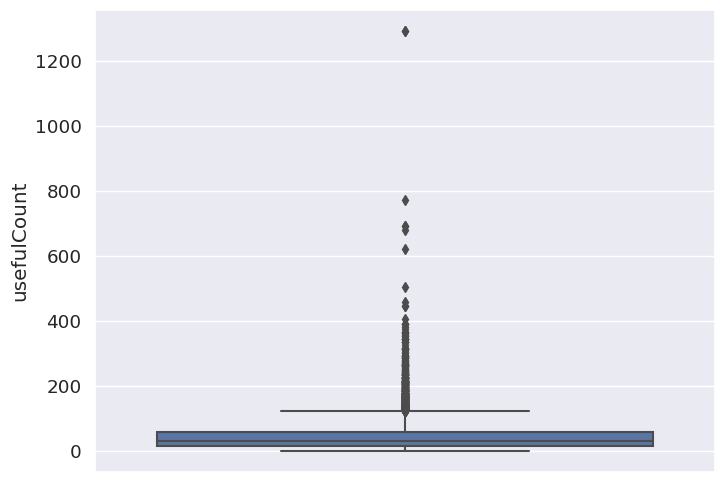

In [48]:
#check the descriptive summary
sns.boxplot(y = drug1['usefulCount'])
plt.show()

 There are huge outliers present in our dataset.
 
 Some drugs have extreme useful counts.

In [69]:
drug_train = drug[(drug['condition']=='Depression') | (drug['condition']=='High Blood Pressure')|(drug['condition']=='Diabetes, Type 2')]
drug.shape

(104451, 7)

In [70]:
drug_train.shape

(9046, 7)

In [71]:
X = drug_train.drop(['Unnamed: 0','drugName','rating','date','usefulCount'],axis=1)

In [72]:
X.condition.value_counts()

Depression             5847
Diabetes, Type 2       1708
High Blood Pressure    1491
Name: condition, dtype: int64

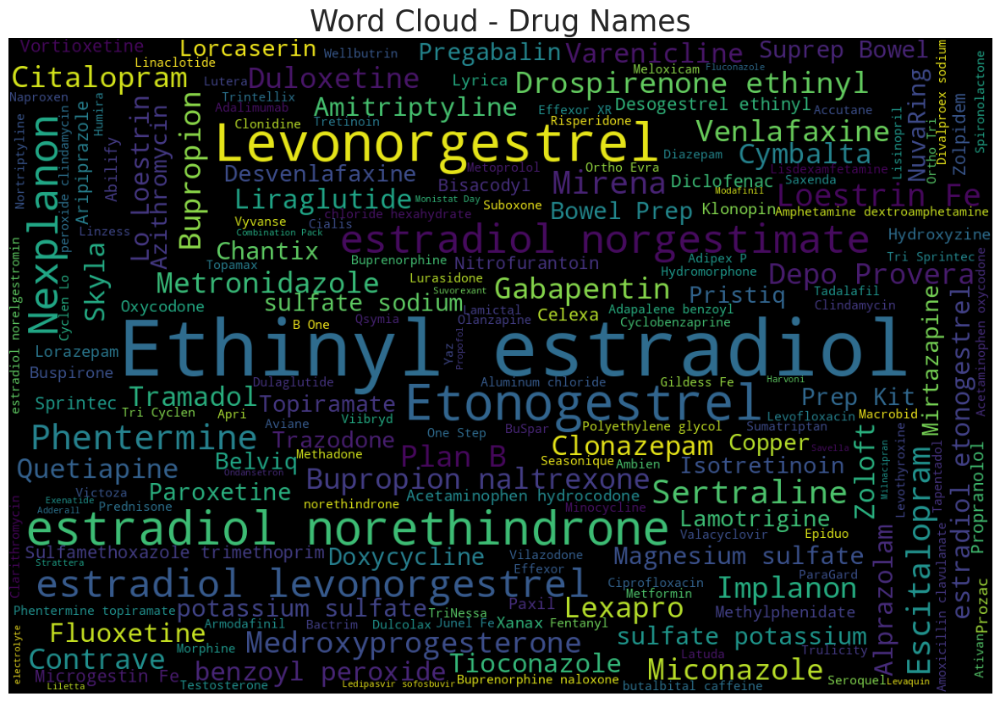

In [67]:
# let's see the words cloud for the reviews 

# most popular drugs

from wordcloud import WordCloud
from wordcloud import STOPWORDS

stopwords = set(STOPWORDS)

wordcloud = WordCloud(background_color = 'black', stopwords = stopwords, width = 1200, height = 800).generate(str(drug['drugName']))

plt.rcParams['figure.figsize'] = (15, 15)
plt.title('Word Cloud - Drug Names', fontsize = 25)
print(wordcloud)
plt.axis('off')
plt.imshow(wordcloud)
plt.show()

**EDA**

In [58]:
X.condition.value_counts()

Depression             5847
Diabetes, Type 2       1708
High Blood Pressure    1491
Name: condition, dtype: int64

In [59]:
X.head()

,condition,review
11,Depression,"""I have taken anti-depressants for years, with..."
31,Depression,"""1 week on Zoloft for anxiety and mood swings...."
44,Depression,"""my gp started me on Venlafaxine yesterday to ..."
50,"Diabetes, Type 2","""Hey Guys, It&#039;s been 4 months since my l..."
67,Depression,"""This medicine saved my life. I was at my wits..."


In [60]:
# segregating dataframe for analyzing individual condition

X_dep=X[(X['condition']=='Depression')]
X_bp=X[(X['condition']=='High Blood Pressure')]
X_diab=X[(X['condition']=='Diabetes, Type 2')]

Text(0.5, 1.0, 'Word cloud for Depression')

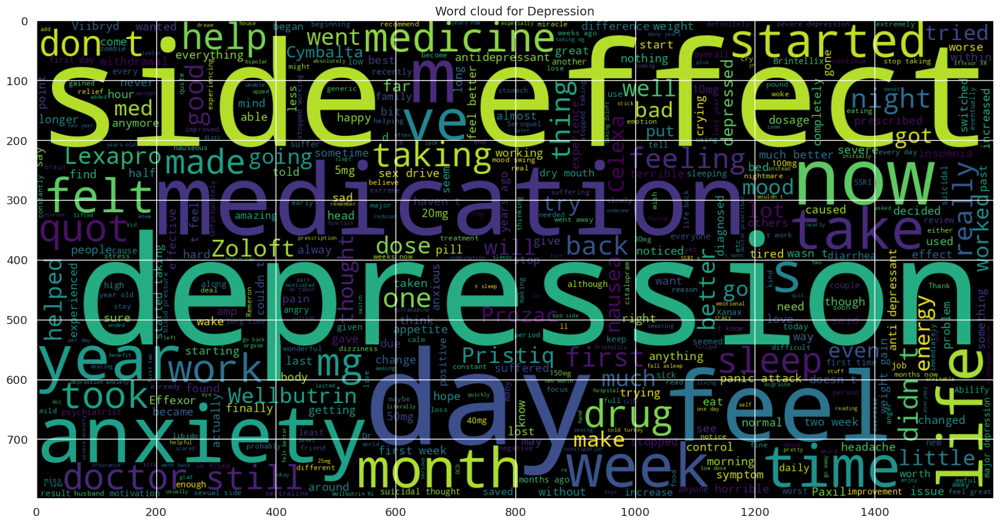

In [63]:
plt.figure(figsize = (20,20)) # Text that is Fake News Headlines
wc = WordCloud(max_words = 500 , width = 1600 , height = 800).generate(" ".join(X_dep.review))
plt.imshow(wc , interpolation = 'bilinear')
plt.title('Word cloud for Depression',fontsize=14)

Text(0.5, 1.0, 'Word cloud for High Blood Pressure')

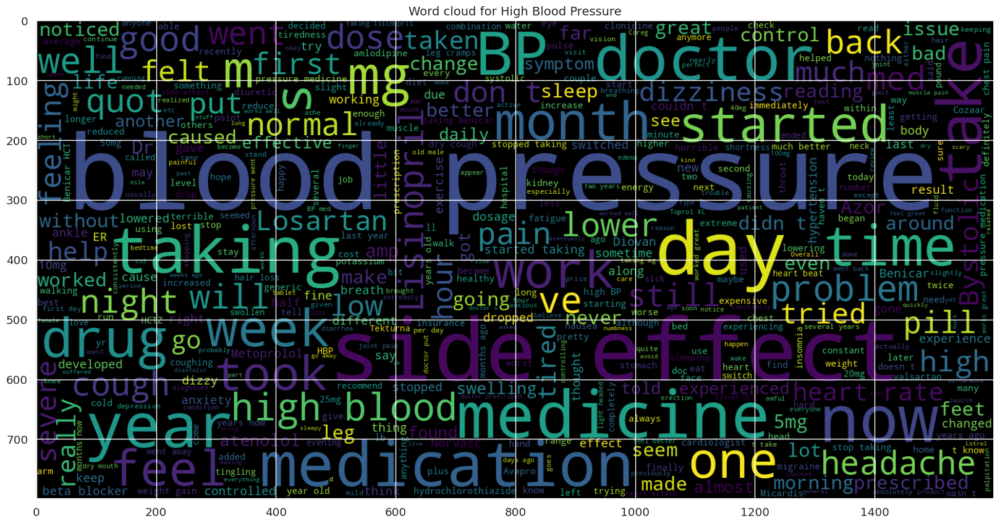

In [64]:
plt.figure(figsize = (20,20)) # Text that is Fake News Headlines
wc = WordCloud(max_words = 500 , width = 1600 , height = 800).generate(" ".join(X_bp.review))
plt.imshow(wc , interpolation = 'bilinear')
plt.title('Word cloud for High Blood Pressure',fontsize=14)

Text(0.5, 1.0, 'Word cloud for Diabetes Type 2')

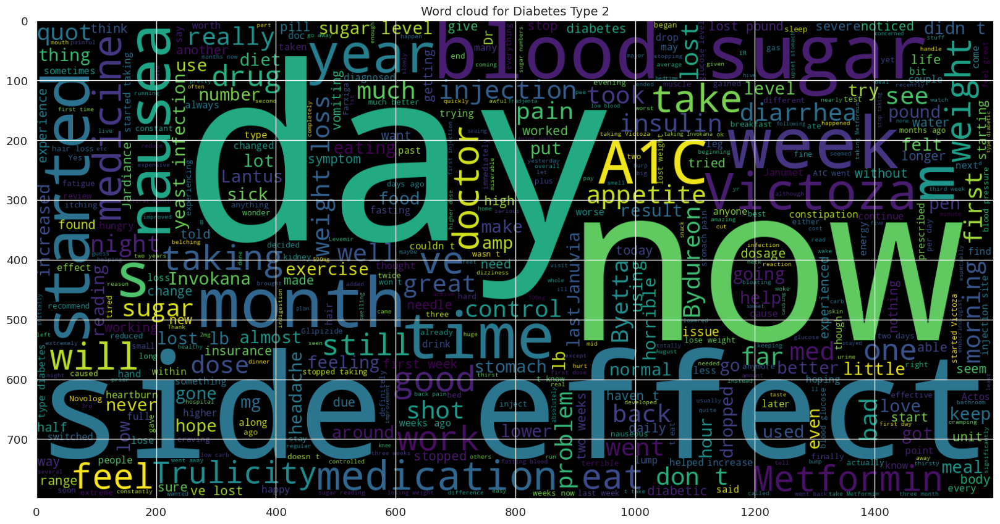

In [65]:
plt.figure(figsize = (20,20)) # Text that is Fake News Headlines
wc = WordCloud(max_words = 500 , width = 1600 , height = 800).generate(" ".join(X_diab.review))
plt.imshow(wc , interpolation = 'bilinear')
plt.title('Word cloud for Diabetes Type 2',fontsize=14)